In [1]:
#https://arxiv.org/abs/1703.05192
import scipy
from glob import glob
import numpy as np
from __future__ import print_function, division
import scipy
from keras.datasets import mnist
from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization
from keras.layers import Input, Dense, Reshape, Flatten, Dropout, Concatenate
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam
import datetime
import matplotlib.pyplot as plt
import sys
import numpy as np
import os

C:\Users\kenneth\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
class DataLoader():
    def __init__(self, dataset_name, img_res=(128, 128)):
        self.dataset_name = dataset_name
        self.img_res = img_res

    def load_data(self, batch_size=1, is_testing=False):
        data_type = "train" if not is_testing else "val"
        path = glob('./datasets/%s/%s/*' % (self.dataset_name, data_type))

        batch = np.random.choice(path, size=batch_size)

        imgs_A, imgs_B = [], []
        for img in batch:
            img = self.imread(img)
            h, w, _ = img.shape
            half_w = int(w/2)
            img_A = img[:, :half_w, :]
            img_B = img[:, half_w:, :]

            img_A = scipy.misc.imresize(img_A, self.img_res)
            img_B = scipy.misc.imresize(img_B, self.img_res)

            if not is_testing and np.random.random() > 0.5:
                    img_A = np.fliplr(img_A)
                    img_B = np.fliplr(img_B)

            imgs_A.append(img_A)
            imgs_B.append(img_B)

        imgs_A = np.array(imgs_A)/127.5 - 1.
        imgs_B = np.array(imgs_B)/127.5 - 1.

        return imgs_A, imgs_B

    def load_batch(self, batch_size=1, is_testing=False):
        data_type = "train" if not is_testing else "val"
        path = glob('./datasets/%s/%s/*' % (self.dataset_name, data_type))

        self.n_batches = int(len(path) / batch_size)

        for i in range(self.n_batches-1):
            batch = path[i*batch_size:(i+1)*batch_size]
            imgs_A, imgs_B = [], []
            for img in batch:
                img = self.imread(img)
                h, w, _ = img.shape
                half_w = int(w/2)
                img_A = img[:, :half_w, :]
                img_B = img[:, half_w:, :]

                img_A = scipy.misc.imresize(img_A, self.img_res)
                img_B = scipy.misc.imresize(img_B, self.img_res)

                if not is_testing and np.random.random() > 0.5:
                        img_A = np.fliplr(img_A)
                        img_B = np.fliplr(img_B)

                imgs_A.append(img_A)
                imgs_B.append(img_B)

            imgs_A = np.array(imgs_A)/127.5 - 1.
            imgs_B = np.array(imgs_B)/127.5 - 1.

            yield imgs_A, imgs_B

    def load_img(self, path):
        img = self.imread(path)
        img = scipy.misc.imresize(img, self.img_res)
        img = img/127.5 - 1.
        return img[np.newaxis, :, :, :]

    def imread(self, path):
        return scipy.misc.imread(path, mode='RGB').astype(np.float)


In [3]:
class DiscoGAN():
    def __init__(self):
        # Input shape
        self.img_rows = 128
        self.img_cols = 128
        self.channels = 3
        self.img_shape = (self.img_rows, self.img_cols, self.channels)

        # Configure data loader
        self.dataset_name = 'edges2shoes'
        self.data_loader = DataLoader(dataset_name=self.dataset_name,
                                      img_res=(self.img_rows, self.img_cols))


        # Calculate output shape of D (PatchGAN)
        patch = int(self.img_rows / 2**4)
        self.disc_patch = (patch, patch, 1)

        # Number of filters in the first layer of G and D
        self.gf = 64
        self.df = 64

        optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminators
        self.d_A = self.build_discriminator()
        self.d_B = self.build_discriminator()
        self.d_A.compile(loss='mse',
            optimizer=optimizer,
            metrics=['accuracy'])
        self.d_B.compile(loss='mse',
            optimizer=optimizer,
            metrics=['accuracy'])

        #-------------------------
        # Construct Computational
        #   Graph of Generators
        #-------------------------

        # Build the generators
        self.g_AB = self.build_generator()
        self.g_BA = self.build_generator()

        # Input images from both domains
        img_A = Input(shape=self.img_shape)
        img_B = Input(shape=self.img_shape)

        # Translate images to the other domain
        fake_B = self.g_AB(img_A)
        fake_A = self.g_BA(img_B)
        # Translate images back to original domain
        reconstr_A = self.g_BA(fake_B)
        reconstr_B = self.g_AB(fake_A)

        # For the combined model we will only train the generators
        self.d_A.trainable = False
        self.d_B.trainable = False

        # Discriminators determines validity of translated images
        valid_A = self.d_A(fake_A)
        valid_B = self.d_B(fake_B)

        # Objectives
        # + Adversarial: Fool domain discriminators
        # + Translation: Minimize MAE between e.g. fake B and true B
        # + Cycle-consistency: Minimize MAE between reconstructed images and original
        self.combined = Model(inputs=[img_A, img_B],
                              outputs=[ valid_A, valid_B,
                                        fake_B, fake_A,
                                        reconstr_A, reconstr_B ])
        self.combined.compile(loss=['mse', 'mse',
                                    'mae', 'mae',
                                    'mae', 'mae'],
                              optimizer=optimizer)

    def build_generator(self):
        """U-Net Generator"""

        def conv2d(layer_input, filters, f_size=4, normalize=True):
            """Layers used during downsampling"""
            d = Conv2D(filters, kernel_size=f_size, strides=2, padding='same')(layer_input)
            d = LeakyReLU(alpha=0.2)(d)
            if normalize:
                d = InstanceNormalization()(d)
            return d

        def deconv2d(layer_input, skip_input, filters, f_size=4, dropout_rate=0):
            """Layers used during upsampling"""
            u = UpSampling2D(size=2)(layer_input)
            u = Conv2D(filters, kernel_size=f_size, strides=1, padding='same', activation='relu')(u)
            if dropout_rate:
                u = Dropout(dropout_rate)(u)
            u = InstanceNormalization()(u)
            u = Concatenate()([u, skip_input])
            return u

        # Image input
        d0 = Input(shape=self.img_shape)

        # Downsampling
        d1 = conv2d(d0, self.gf, normalize=False)
        d2 = conv2d(d1, self.gf*2)
        d3 = conv2d(d2, self.gf*4)
        d4 = conv2d(d3, self.gf*8)
        d5 = conv2d(d4, self.gf*8)
        d6 = conv2d(d5, self.gf*8)
        d7 = conv2d(d6, self.gf*8)

        # Upsampling
        u1 = deconv2d(d7, d6, self.gf*8)
        u2 = deconv2d(u1, d5, self.gf*8)
        u3 = deconv2d(u2, d4, self.gf*8)
        u4 = deconv2d(u3, d3, self.gf*4)
        u5 = deconv2d(u4, d2, self.gf*2)
        u6 = deconv2d(u5, d1, self.gf)

        u7 = UpSampling2D(size=2)(u6)
        output_img = Conv2D(self.channels, kernel_size=4, strides=1,
                            padding='same', activation='tanh')(u7)

        return Model(d0, output_img)

    def build_discriminator(self):

        def d_layer(layer_input, filters, f_size=4, normalization=True):
            """Discriminator layer"""
            d = Conv2D(filters, kernel_size=f_size, strides=2, padding='same')(layer_input)
            d = LeakyReLU(alpha=0.2)(d)
            if normalization:
                d = InstanceNormalization()(d)
            return d

        img = Input(shape=self.img_shape)

        d1 = d_layer(img, self.df, normalization=False)
        d2 = d_layer(d1, self.df*2)
        d3 = d_layer(d2, self.df*4)
        d4 = d_layer(d3, self.df*8)

        validity = Conv2D(1, kernel_size=4, strides=1, padding='same')(d4)

        return Model(img, validity)

    def train(self, epochs, batch_size=128, sample_interval=50):

        start_time = datetime.datetime.now()

        # Adversarial loss ground truths
        valid = np.ones((batch_size,) + self.disc_patch)
        fake = np.zeros((batch_size,) + self.disc_patch)

        for epoch in range(epochs):

            for batch_i, (imgs_A, imgs_B) in enumerate(self.data_loader.load_batch(batch_size)):

                # ----------------------
                #  Train Discriminators
                # ----------------------

                # Translate images to opposite domain
                fake_B = self.g_AB.predict(imgs_A)
                fake_A = self.g_BA.predict(imgs_B)

                # Train the discriminators (original images = real / translated = Fake)
                dA_loss_real = self.d_A.train_on_batch(imgs_A, valid)
                dA_loss_fake = self.d_A.train_on_batch(fake_A, fake)
                dA_loss = 0.5 * np.add(dA_loss_real, dA_loss_fake)

                dB_loss_real = self.d_B.train_on_batch(imgs_B, valid)
                dB_loss_fake = self.d_B.train_on_batch(fake_B, fake)
                dB_loss = 0.5 * np.add(dB_loss_real, dB_loss_fake)

                # Total disciminator loss
                d_loss = 0.5 * np.add(dA_loss, dB_loss)

                # ------------------
                #  Train Generators
                # ------------------

                # Train the generators
                g_loss = self.combined.train_on_batch([imgs_A, imgs_B], [valid, valid, \
                                                                         imgs_B, imgs_A, \
                                                                         imgs_A, imgs_B])

                elapsed_time = datetime.datetime.now() - start_time
                # Plot the progress
#                 print ("[%d] [%d/%d] time: %s, [d_loss: %f, g_loss: %f]" % (epoch, batch_i,
#                                                                         self.data_loader.n_batches,
#                                                                         elapsed_time,
#                                                                         d_loss[0], g_loss[0]))

                # If at save interval => save generated image samples
                if batch_i % sample_interval == 0:
                    self.sample_images(epoch, batch_i)
                    print ("[%d] [%d/%d] time: %s, [d_loss: %f, g_loss: %f]" % (epoch, batch_i,
                                                                        self.data_loader.n_batches,
                                                                        elapsed_time,
                                                                        d_loss[0], g_loss[0]))


    def sample_images(self, epoch, batch_i):
        os.makedirs('images/%s' % self.dataset_name, exist_ok=True)
        r, c = 2, 3

        imgs_A, imgs_B = self.data_loader.load_data(batch_size=1, is_testing=True)

        # Translate images to the other domain
        fake_B = self.g_AB.predict(imgs_A)
        fake_A = self.g_BA.predict(imgs_B)
        # Translate back to original domain
        reconstr_A = self.g_BA.predict(fake_B)
        reconstr_B = self.g_AB.predict(fake_A)

        gen_imgs = np.concatenate([imgs_A, fake_B, reconstr_A, imgs_B, fake_A, reconstr_B])

        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        titles = ['Original', 'Translated', 'Reconstructed']
        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt])
                axs[i, j].set_title(titles[j])
                axs[i,j].axis('off')
                cnt += 1
        fig.savefig("images/%s/%d_%d.png" % (self.dataset_name, epoch, batch_i))
        plt.imread("images/%s/%d_%d.png" % (self.dataset_name, epoch, batch_i))
        plt.show()
        plt.close()

C:\Users\kenneth\Anaconda3\lib\site-packages\ipykernel\__main__.py:73: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
C:\Users\kenneth\Anaconda3\lib\site-packages\ipykernel\__main__.py:51: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
C:\Users\kenneth\Anaconda3\lib\site-packages\ipykernel\__main__.py:52: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
C:\Users\kenneth\Anaconda3\lib\site-packages\keras\engine\training.py:479: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
C:\Users\kenneth\Anaconda3\li

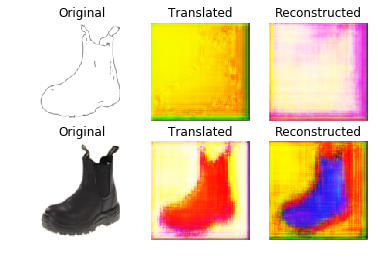

[0] [0/24912] time: 0:00:30.976884, [d_loss: 6.240438, g_loss: 69.450615]


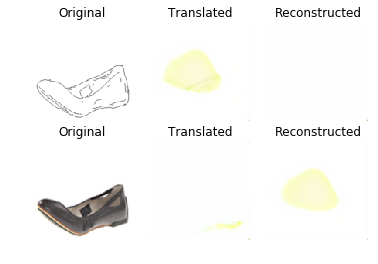

[0] [500/24912] time: 0:04:50.624063, [d_loss: 0.301140, g_loss: 2.681552]


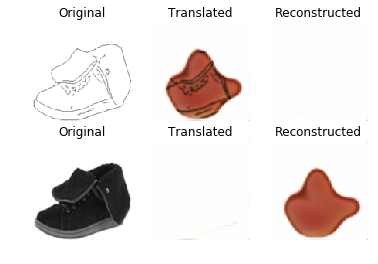

[0] [1000/24912] time: 0:09:23.741484, [d_loss: 0.324203, g_loss: 1.342946]


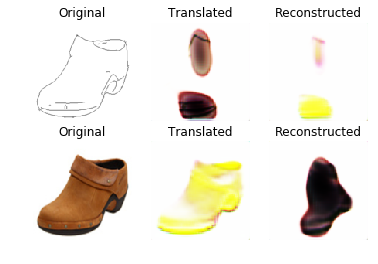

[0] [1500/24912] time: 0:13:58.152992, [d_loss: 0.304890, g_loss: 1.613943]


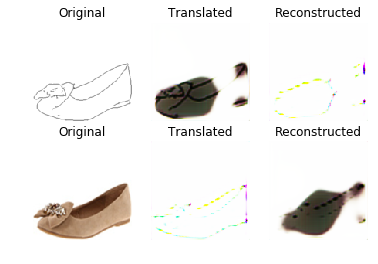

[0] [2000/24912] time: 0:18:24.199939, [d_loss: 0.155808, g_loss: 1.821236]


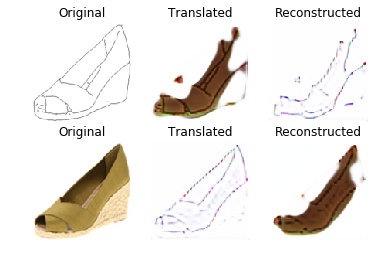

[0] [2500/24912] time: 0:22:58.448750, [d_loss: 0.260365, g_loss: 0.999625]


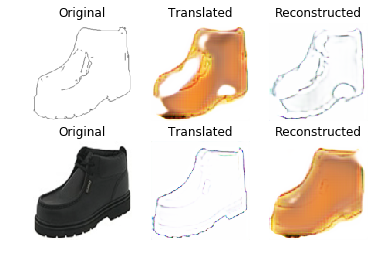

[0] [3000/24912] time: 0:27:27.386869, [d_loss: 0.157952, g_loss: 1.885700]


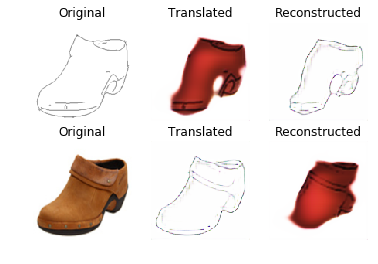

[0] [3500/24912] time: 0:31:59.351257, [d_loss: 0.301448, g_loss: 0.881660]


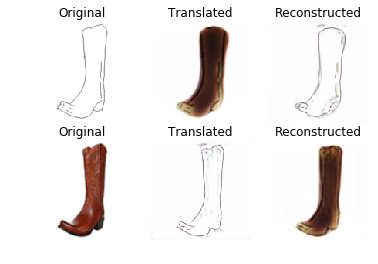

[0] [4000/24912] time: 0:36:31.305580, [d_loss: 0.179963, g_loss: 1.608581]


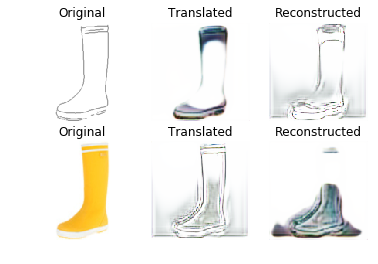

[0] [4500/24912] time: 0:40:59.513769, [d_loss: 0.203572, g_loss: 1.726766]


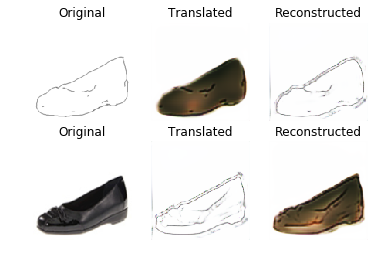

[0] [5000/24912] time: 0:45:28.680480, [d_loss: 0.274590, g_loss: 1.573076]


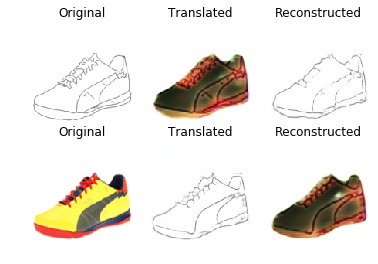

[0] [5500/24912] time: 0:49:48.920396, [d_loss: 0.152205, g_loss: 1.957373]


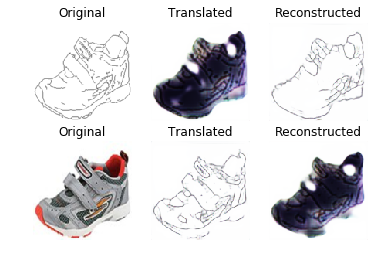

[0] [6000/24912] time: 0:54:22.058368, [d_loss: 0.242353, g_loss: 1.990853]


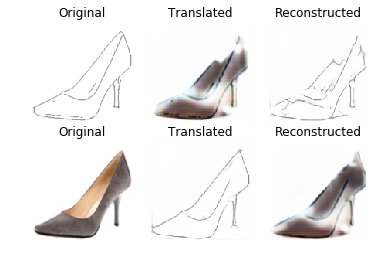

[0] [6500/24912] time: 0:58:55.058779, [d_loss: 0.148837, g_loss: 1.867336]


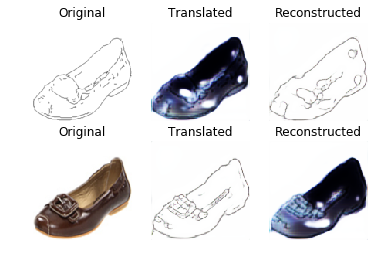

[0] [7000/24912] time: 1:03:30.361416, [d_loss: 0.240424, g_loss: 2.221308]


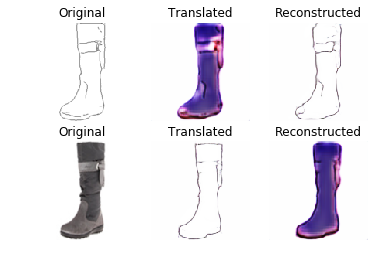

[0] [7500/24912] time: 1:08:01.933094, [d_loss: 0.258660, g_loss: 1.176380]


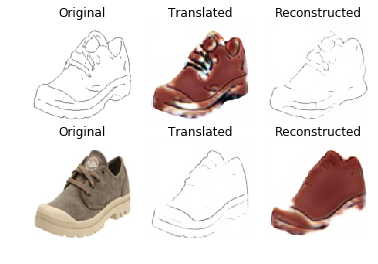

[0] [8000/24912] time: 1:12:34.659663, [d_loss: 0.260961, g_loss: 0.836056]


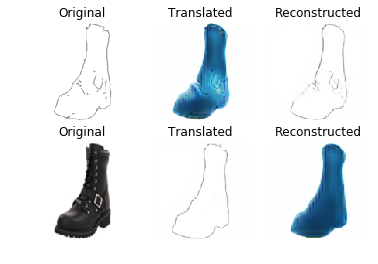

[0] [8500/24912] time: 1:17:05.516712, [d_loss: 0.263156, g_loss: 1.188629]


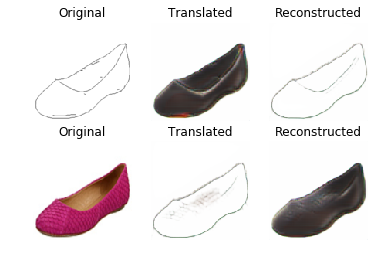

[0] [9000/24912] time: 1:21:35.776364, [d_loss: 0.259410, g_loss: 0.859145]


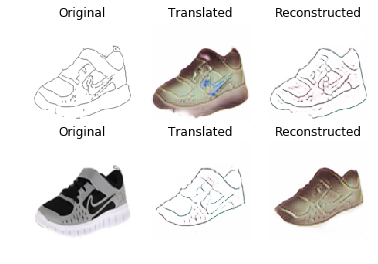

[0] [9500/24912] time: 1:26:15.777291, [d_loss: 0.249098, g_loss: 0.861668]


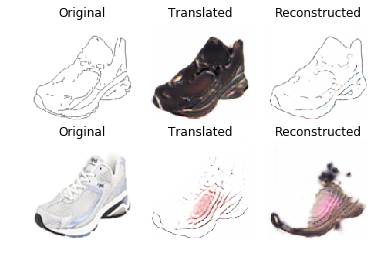

[0] [10000/24912] time: 1:40:37.241180, [d_loss: 0.262197, g_loss: 0.809884]


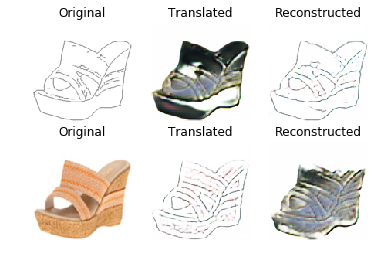

[0] [10500/24912] time: 1:46:49.805264, [d_loss: 0.263004, g_loss: 1.224891]


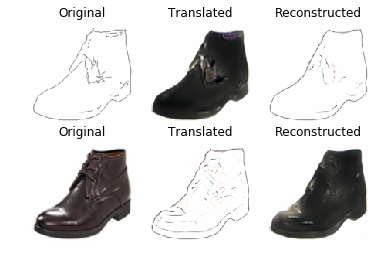

[0] [11000/24912] time: 1:52:20.647332, [d_loss: 0.260525, g_loss: 0.840657]


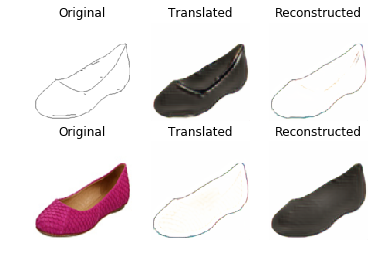

[0] [11500/24912] time: 2:13:49.741945, [d_loss: 0.317568, g_loss: 0.712472]


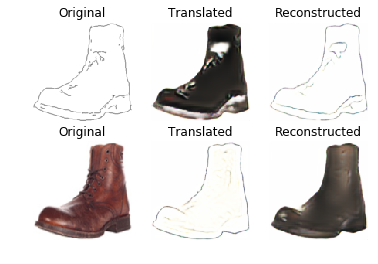

[0] [12000/24912] time: 2:25:27.807295, [d_loss: 0.303131, g_loss: 0.694438]


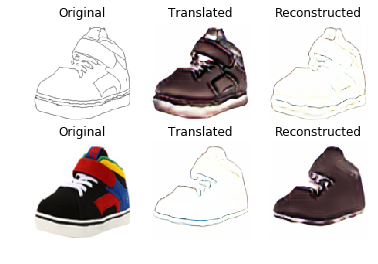

[0] [12500/24912] time: 2:30:28.472884, [d_loss: 0.293703, g_loss: 0.771872]


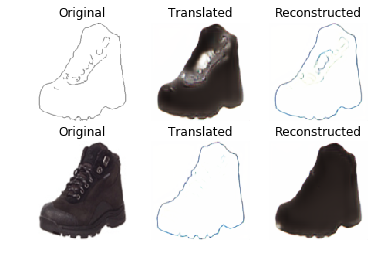

[0] [13000/24912] time: 2:35:27.304898, [d_loss: 0.283471, g_loss: 1.072593]


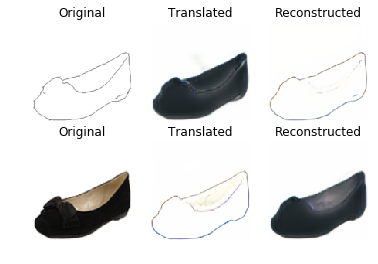

[0] [13500/24912] time: 2:40:54.489495, [d_loss: 0.275760, g_loss: 0.943367]


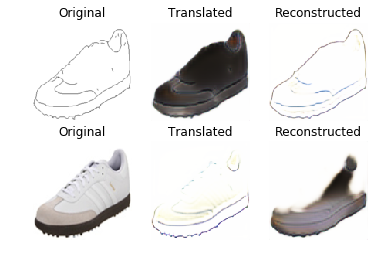

[0] [14000/24912] time: 2:47:44.127260, [d_loss: 0.257715, g_loss: 0.777359]


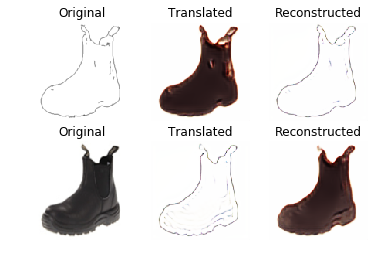

[0] [14500/24912] time: 2:53:50.987082, [d_loss: 0.227959, g_loss: 0.976305]


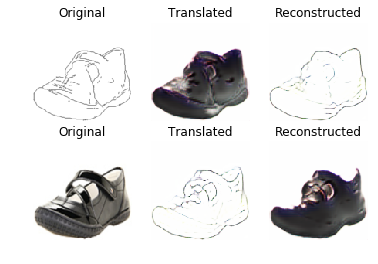

[0] [15000/24912] time: 3:04:47.255963, [d_loss: 0.254546, g_loss: 0.831065]


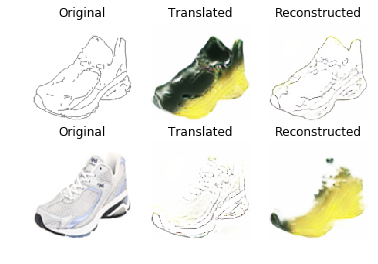

[0] [15500/24912] time: 3:14:29.611938, [d_loss: 0.310829, g_loss: 1.558434]


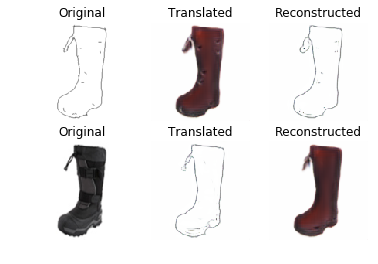

[0] [16000/24912] time: 3:21:40.075718, [d_loss: 0.244734, g_loss: 1.054523]


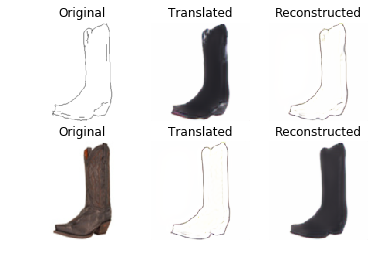

[0] [16500/24912] time: 3:31:14.620929, [d_loss: 0.258303, g_loss: 1.026803]


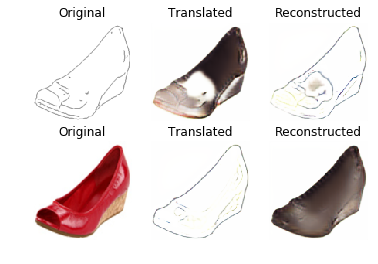

[0] [17000/24912] time: 3:36:24.451710, [d_loss: 0.288051, g_loss: 1.264144]


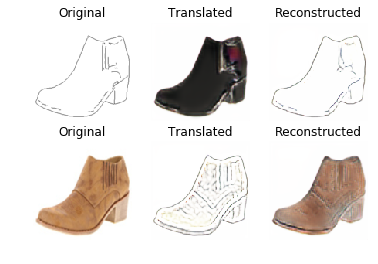

[0] [17500/24912] time: 3:41:28.310499, [d_loss: 0.252337, g_loss: 0.892648]


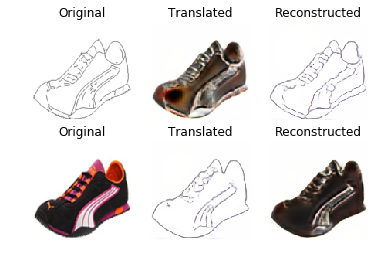

[0] [18000/24912] time: 3:46:21.051357, [d_loss: 0.241459, g_loss: 1.051765]


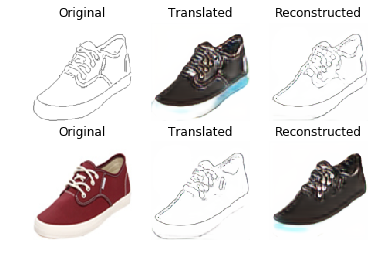

[0] [18500/24912] time: 3:51:20.628425, [d_loss: 0.259690, g_loss: 0.918835]


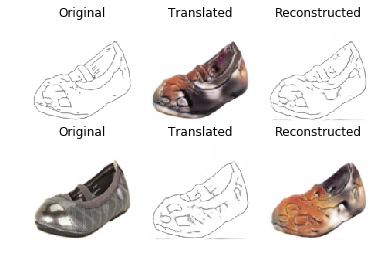

[0] [19000/24912] time: 3:56:17.425695, [d_loss: 0.182064, g_loss: 1.382179]


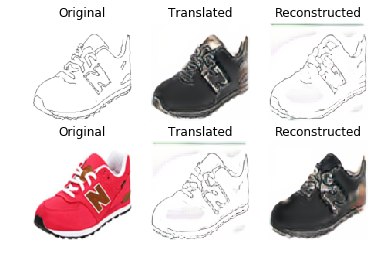

[0] [19500/24912] time: 4:01:15.868600, [d_loss: 0.163652, g_loss: 1.518281]


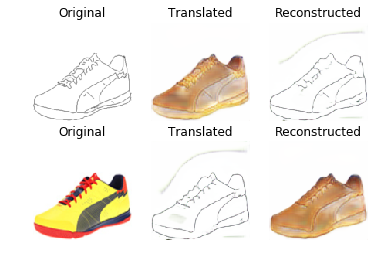

[0] [20000/24912] time: 4:06:02.893761, [d_loss: 0.161643, g_loss: 1.701061]


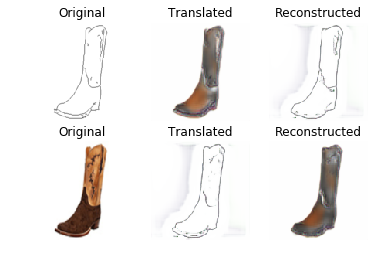

[0] [20500/24912] time: 4:10:42.588989, [d_loss: 0.156513, g_loss: 1.784655]


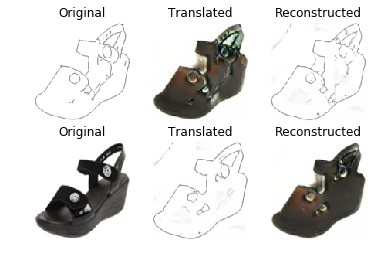

[0] [21000/24912] time: 4:15:22.126989, [d_loss: 0.199502, g_loss: 1.851908]


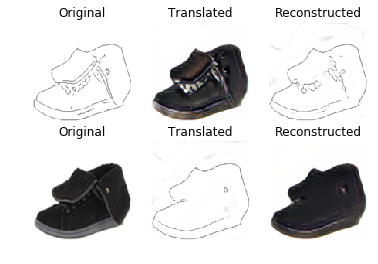

[0] [21500/24912] time: 4:20:00.992660, [d_loss: 0.155260, g_loss: 1.539019]


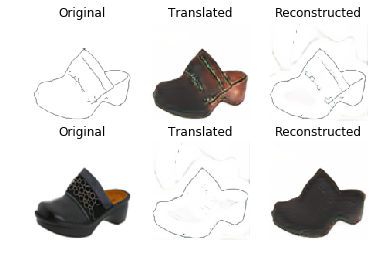

[0] [22000/24912] time: 4:24:40.284900, [d_loss: 0.159275, g_loss: 2.099153]


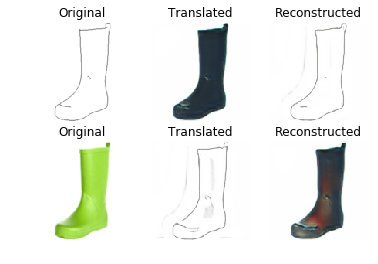

[0] [22500/24912] time: 4:29:42.060295, [d_loss: 0.157282, g_loss: 1.753637]


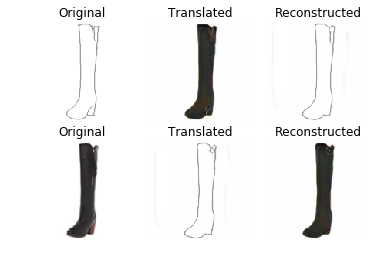

[0] [23000/24912] time: 4:34:25.759853, [d_loss: 0.207634, g_loss: 1.535719]


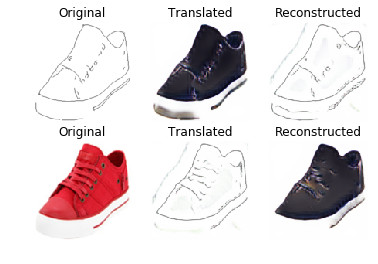

[0] [23500/24912] time: 4:39:49.302466, [d_loss: 0.148813, g_loss: 1.796610]


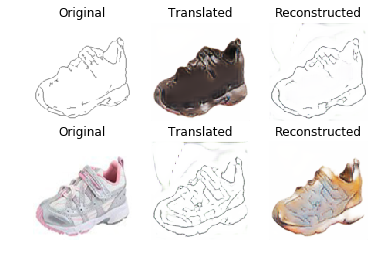

[0] [24000/24912] time: 5:38:08.006129, [d_loss: 0.229669, g_loss: 1.233363]


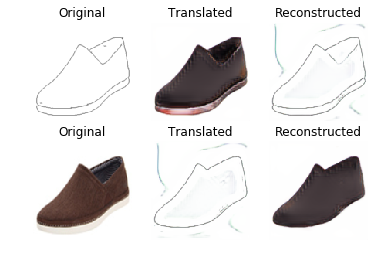

[0] [24500/24912] time: 5:42:46.595342, [d_loss: 0.194689, g_loss: 1.333978]


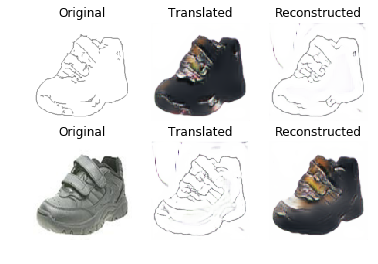

[1] [0/24912] time: 5:46:37.269646, [d_loss: 0.238291, g_loss: 1.382434]


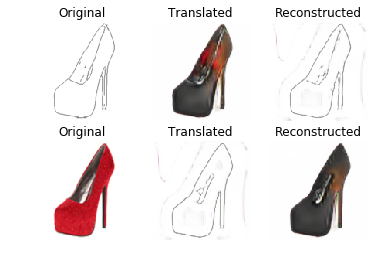

[1] [500/24912] time: 5:51:22.721767, [d_loss: 0.172204, g_loss: 1.542251]


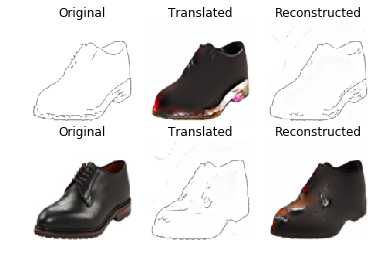

[1] [1000/24912] time: 5:56:01.103518, [d_loss: 0.226447, g_loss: 1.459943]


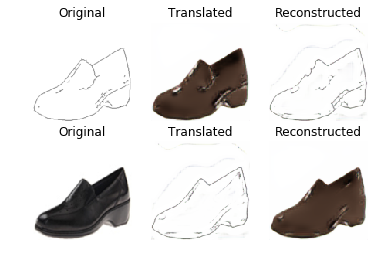

[1] [1500/24912] time: 6:00:36.681151, [d_loss: 0.175933, g_loss: 1.437647]


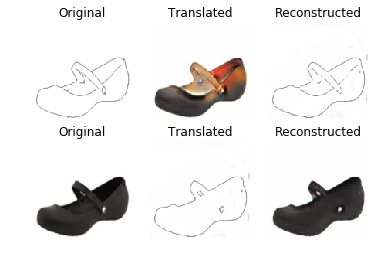

[1] [2000/24912] time: 6:05:12.867067, [d_loss: 0.166265, g_loss: 1.825471]


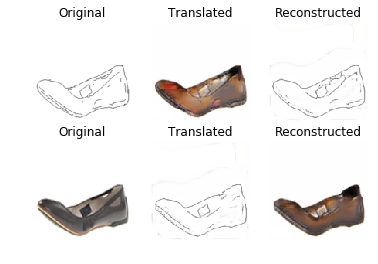

[1] [2500/24912] time: 6:09:48.574081, [d_loss: 0.153261, g_loss: 1.336128]


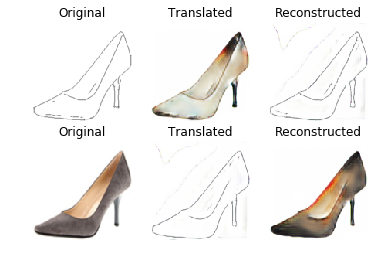

[1] [3000/24912] time: 6:14:24.716290, [d_loss: 0.083257, g_loss: 2.496699]


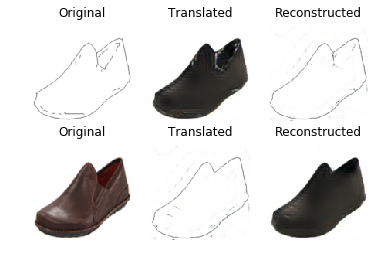

[1] [3500/24912] time: 6:19:00.174025, [d_loss: 0.178807, g_loss: 1.124829]


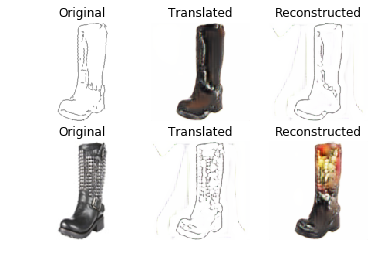

[1] [4000/24912] time: 6:23:38.507884, [d_loss: 0.163554, g_loss: 1.618552]


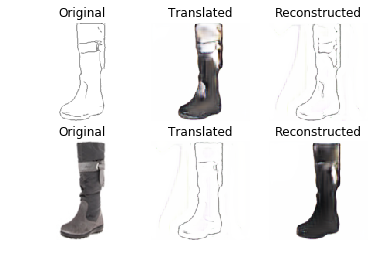

[1] [4500/24912] time: 6:28:15.988497, [d_loss: 0.114164, g_loss: 1.990350]


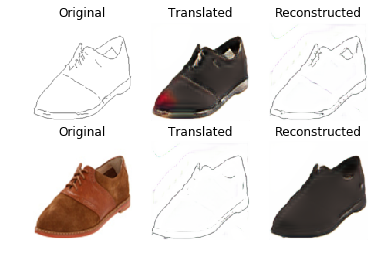

[1] [5000/24912] time: 6:32:52.012843, [d_loss: 0.151722, g_loss: 1.998654]


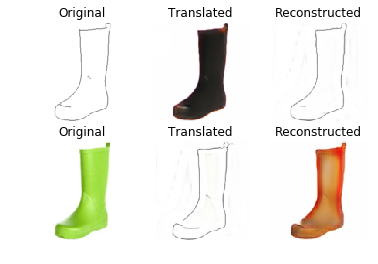

[1] [5500/24912] time: 6:37:28.478439, [d_loss: 0.137959, g_loss: 1.998179]


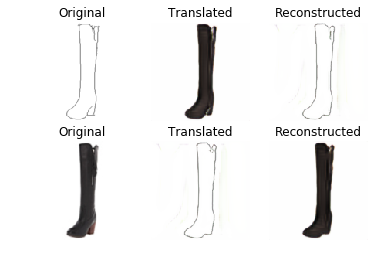

[1] [6000/24912] time: 6:42:04.175365, [d_loss: 0.148100, g_loss: 1.862271]


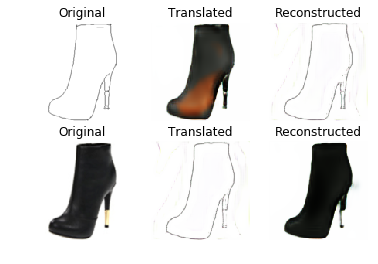

[1] [6500/24912] time: 6:46:41.772491, [d_loss: 0.128966, g_loss: 1.985738]


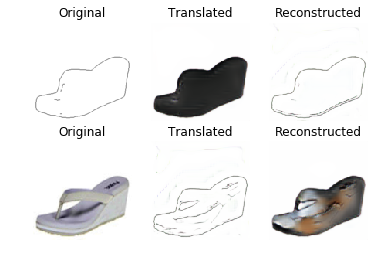

[1] [7000/24912] time: 6:51:19.165629, [d_loss: 0.133968, g_loss: 1.872313]


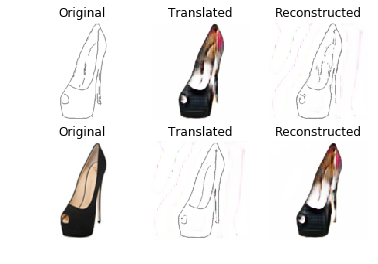

[1] [7500/24912] time: 6:55:58.252491, [d_loss: 0.190867, g_loss: 1.861875]


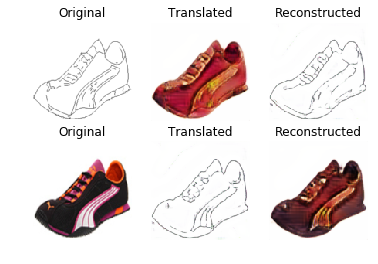

[1] [8000/24912] time: 7:00:34.699879, [d_loss: 0.271797, g_loss: 0.861730]


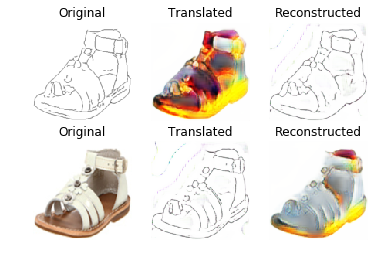

[1] [8500/24912] time: 7:05:09.060258, [d_loss: 0.141612, g_loss: 1.850093]


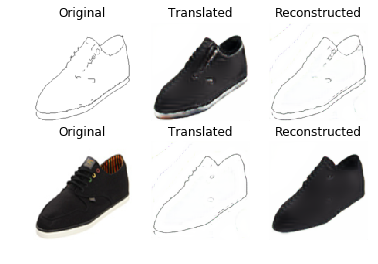

[1] [9000/24912] time: 7:09:45.091897, [d_loss: 0.192319, g_loss: 1.376125]


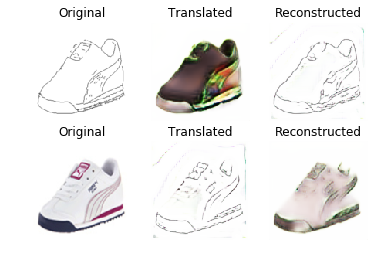

[1] [9500/24912] time: 7:14:20.982928, [d_loss: 0.134175, g_loss: 1.599422]


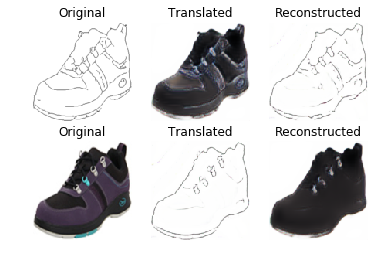

[1] [10000/24912] time: 7:18:57.955031, [d_loss: 0.129964, g_loss: 1.469093]


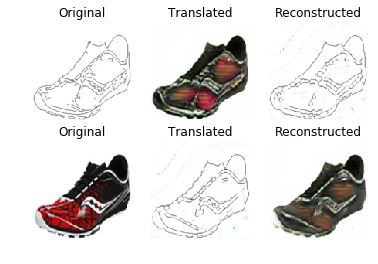

[1] [10500/24912] time: 7:23:31.154513, [d_loss: 0.108779, g_loss: 1.952219]


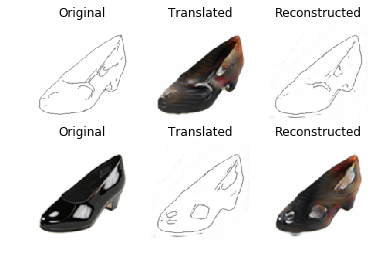

[1] [11000/24912] time: 7:28:03.954898, [d_loss: 0.146688, g_loss: 1.541126]


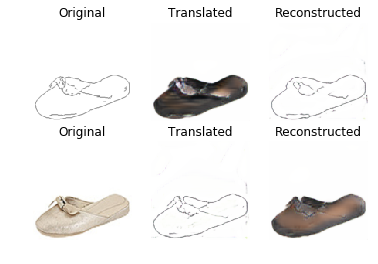

[1] [11500/24912] time: 7:32:36.864631, [d_loss: 0.297220, g_loss: 2.174967]


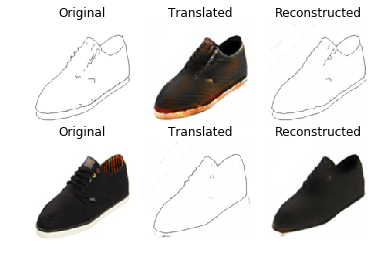

[1] [12000/24912] time: 7:37:09.743355, [d_loss: 0.153824, g_loss: 1.551700]


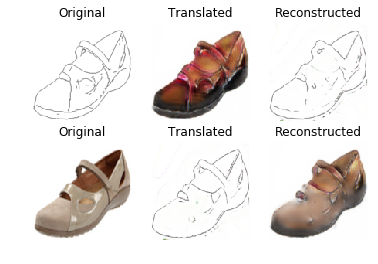

[1] [12500/24912] time: 7:41:42.415735, [d_loss: 0.156525, g_loss: 1.413283]


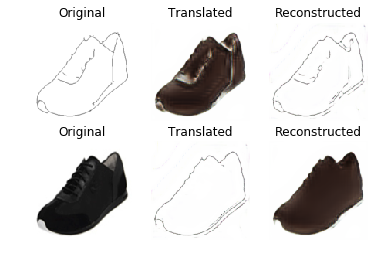

[1] [13000/24912] time: 7:46:15.022157, [d_loss: 0.140627, g_loss: 1.669489]


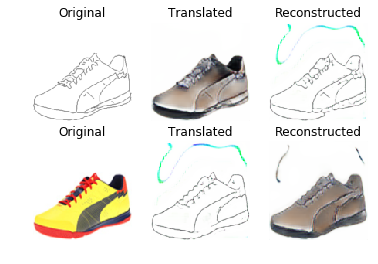

[1] [13500/24912] time: 7:50:47.628766, [d_loss: 0.133615, g_loss: 1.521309]


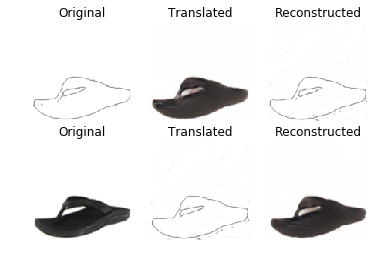

[1] [14000/24912] time: 7:55:20.325150, [d_loss: 0.287655, g_loss: 1.563197]


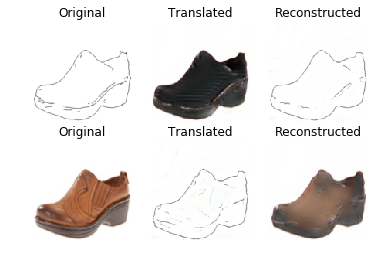

[1] [14500/24912] time: 7:59:52.820484, [d_loss: 0.128277, g_loss: 1.488832]


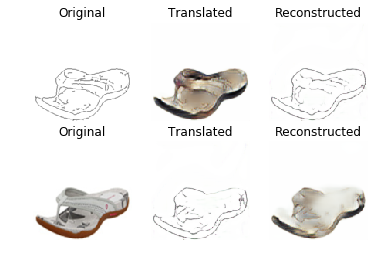

[1] [15000/24912] time: 8:04:25.360364, [d_loss: 0.188444, g_loss: 1.308118]


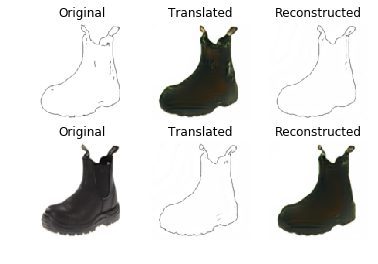

[1] [15500/24912] time: 8:08:57.851252, [d_loss: 0.126698, g_loss: 1.881873]


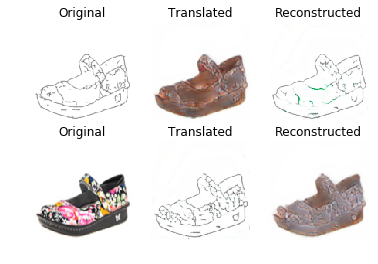

[1] [16000/24912] time: 8:13:30.447981, [d_loss: 0.135562, g_loss: 1.516137]


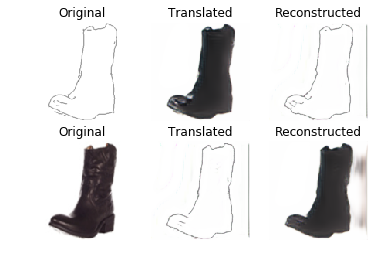

[1] [16500/24912] time: 8:18:03.187718, [d_loss: 0.152104, g_loss: 1.767775]


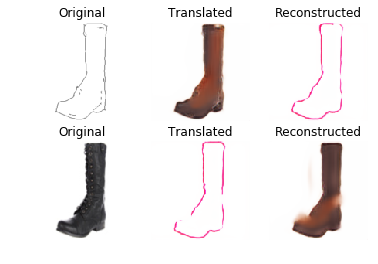

[1] [17000/24912] time: 8:22:35.900746, [d_loss: 0.131370, g_loss: 1.931748]


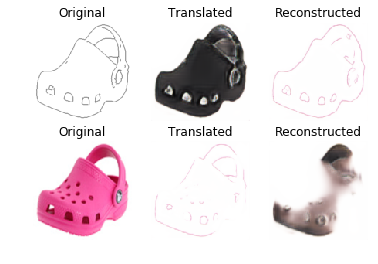

[1] [17500/24912] time: 8:27:08.511740, [d_loss: 0.123543, g_loss: 1.636453]


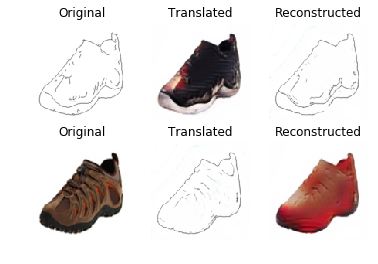

[1] [18000/24912] time: 8:31:41.421217, [d_loss: 0.155109, g_loss: 1.692789]


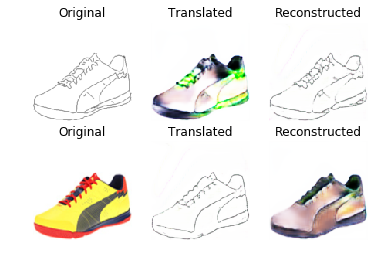

[1] [18500/24912] time: 8:36:14.550721, [d_loss: 0.144951, g_loss: 1.491351]


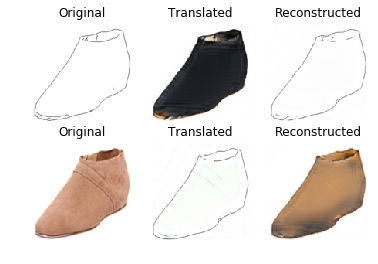

[1] [19000/24912] time: 8:40:47.459406, [d_loss: 0.111941, g_loss: 1.812445]


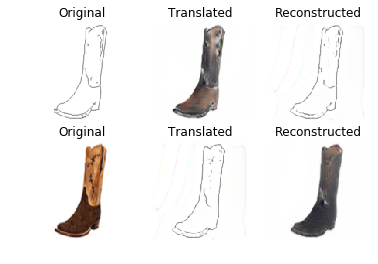

[1] [19500/24912] time: 8:45:20.082112, [d_loss: 0.141202, g_loss: 1.558629]


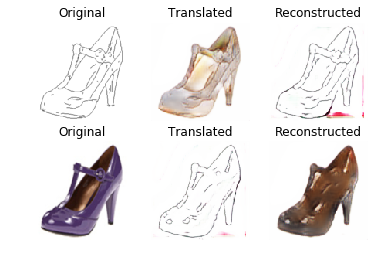

[1] [20000/24912] time: 8:49:53.158949, [d_loss: 0.138551, g_loss: 1.802273]


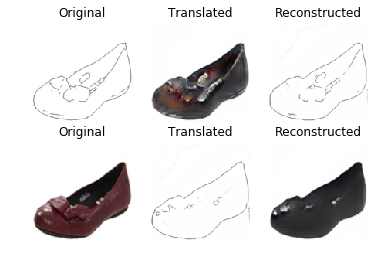

[1] [20500/24912] time: 8:54:26.136486, [d_loss: 0.141469, g_loss: 1.483833]


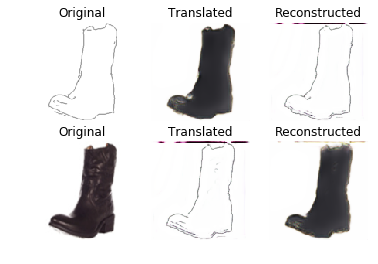

[1] [21000/24912] time: 8:58:59.265619, [d_loss: 0.145486, g_loss: 1.561811]


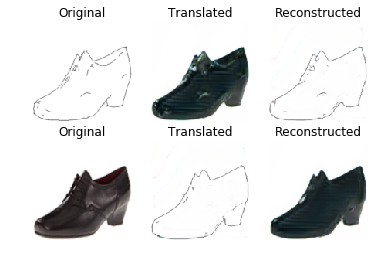

[1] [21500/24912] time: 9:03:31.990617, [d_loss: 0.133082, g_loss: 1.576302]


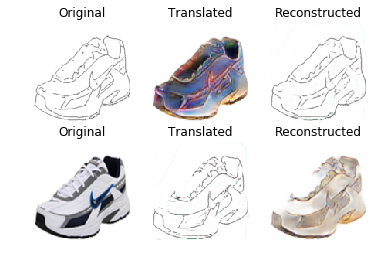

[1] [22000/24912] time: 9:08:04.834696, [d_loss: 0.109792, g_loss: 2.147513]


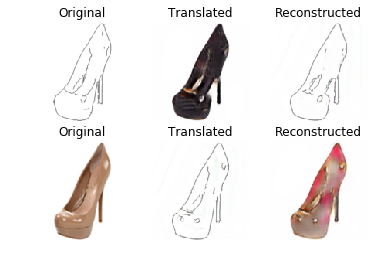

[1] [22500/24912] time: 9:12:37.656336, [d_loss: 0.137110, g_loss: 1.536814]


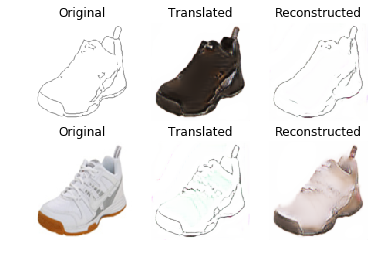

[1] [23000/24912] time: 9:17:10.447469, [d_loss: 0.128449, g_loss: 1.766799]


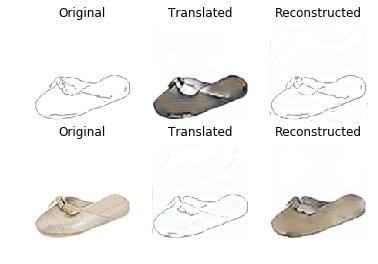

[1] [23500/24912] time: 9:21:43.240945, [d_loss: 0.137590, g_loss: 1.683101]


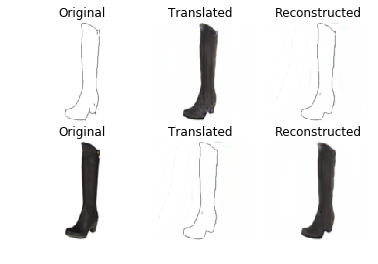

[1] [24000/24912] time: 9:26:16.165736, [d_loss: 0.140499, g_loss: 1.521726]


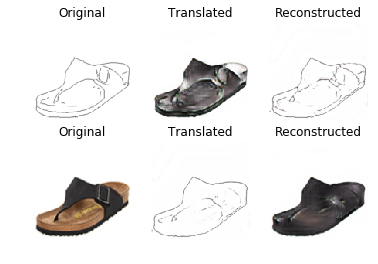

[1] [24500/24912] time: 9:30:48.823687, [d_loss: 0.164011, g_loss: 1.414187]


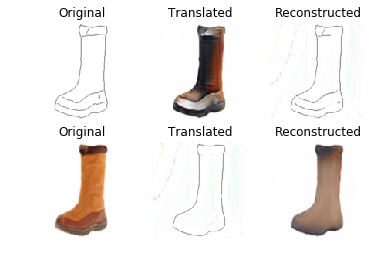

[2] [0/24912] time: 9:34:33.184453, [d_loss: 0.136803, g_loss: 1.405924]


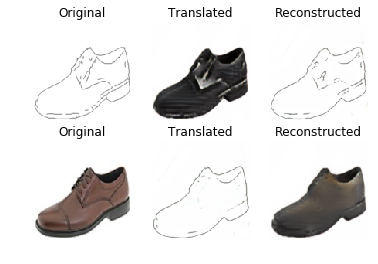

[2] [500/24912] time: 9:39:05.949887, [d_loss: 0.211807, g_loss: 1.613705]


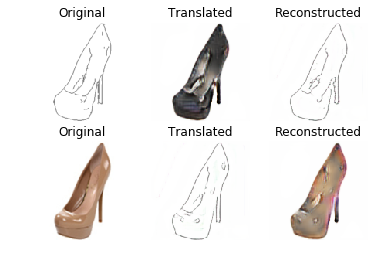

[2] [1000/24912] time: 9:43:38.793677, [d_loss: 0.127810, g_loss: 1.496624]


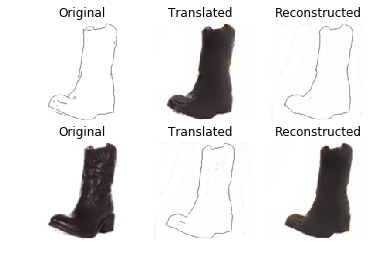

[2] [1500/24912] time: 9:48:11.466394, [d_loss: 0.133713, g_loss: 1.435447]


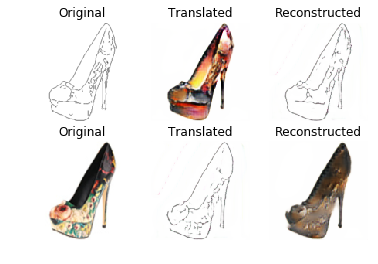

[2] [2000/24912] time: 9:52:44.124648, [d_loss: 0.172849, g_loss: 1.322146]


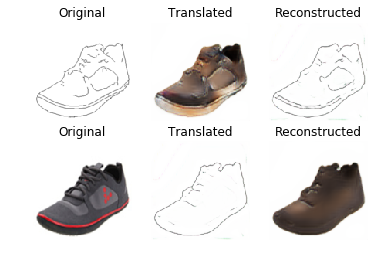

[2] [2500/24912] time: 9:57:16.922981, [d_loss: 0.134914, g_loss: 1.438762]


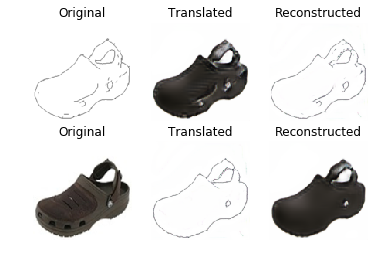

[2] [3000/24912] time: 10:01:49.553286, [d_loss: 0.102452, g_loss: 2.088827]


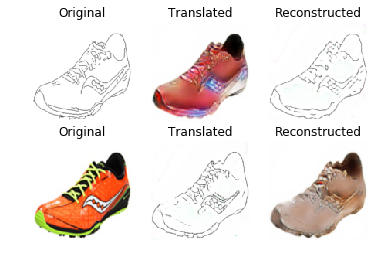

[2] [3500/24912] time: 10:06:22.203063, [d_loss: 0.140840, g_loss: 1.283093]


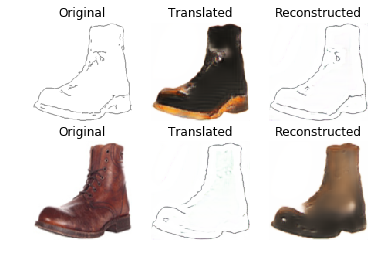

[2] [4000/24912] time: 10:10:54.894884, [d_loss: 0.133298, g_loss: 1.529479]


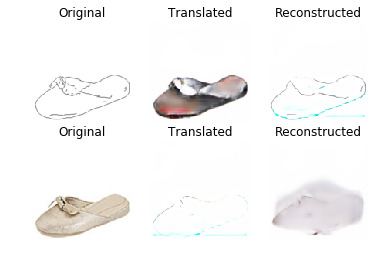

[2] [4500/24912] time: 10:15:27.839910, [d_loss: 0.103970, g_loss: 1.753407]


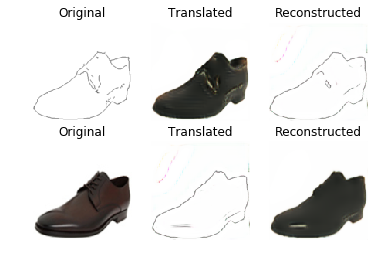

[2] [5000/24912] time: 10:20:00.642762, [d_loss: 0.136421, g_loss: 1.551145]


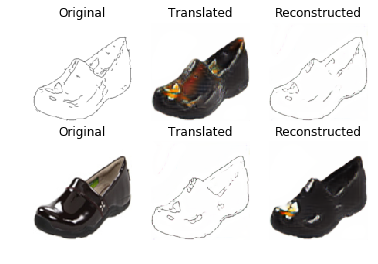

[2] [5500/24912] time: 10:24:33.543320, [d_loss: 0.129036, g_loss: 1.786691]


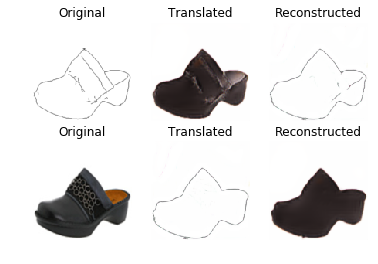

[2] [6000/24912] time: 10:29:06.153950, [d_loss: 0.243539, g_loss: 1.489937]


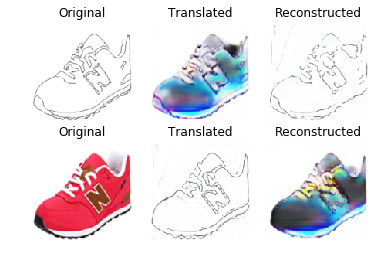

[2] [6500/24912] time: 10:33:38.904264, [d_loss: 0.144930, g_loss: 1.815522]


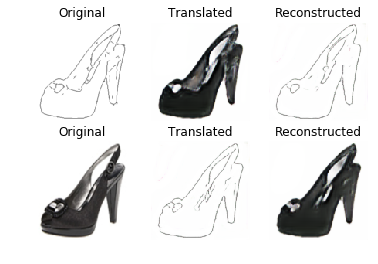

[2] [7000/24912] time: 10:38:11.545063, [d_loss: 0.149557, g_loss: 1.892607]


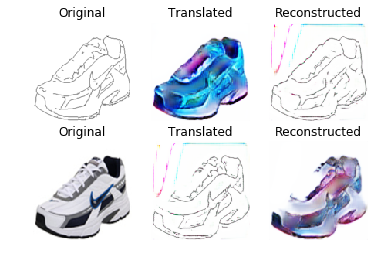

[2] [7500/24912] time: 10:42:44.217275, [d_loss: 0.145047, g_loss: 1.710446]


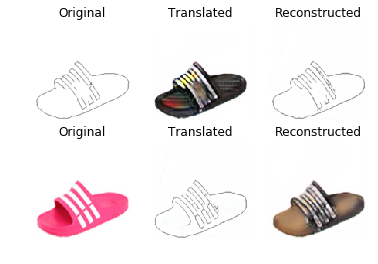

[2] [8000/24912] time: 10:47:16.571199, [d_loss: 0.167631, g_loss: 1.344015]


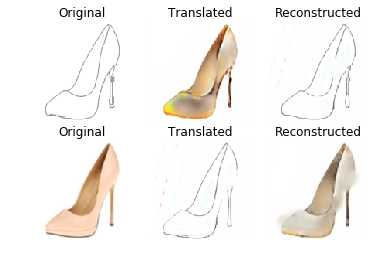

[2] [8500/24912] time: 10:51:49.615252, [d_loss: 0.123334, g_loss: 1.917879]


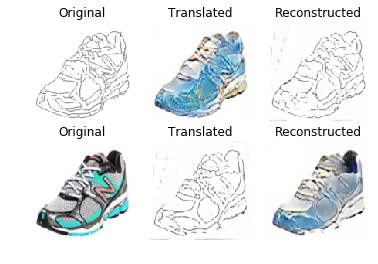

[2] [9000/24912] time: 10:56:22.621977, [d_loss: 0.133555, g_loss: 1.531383]


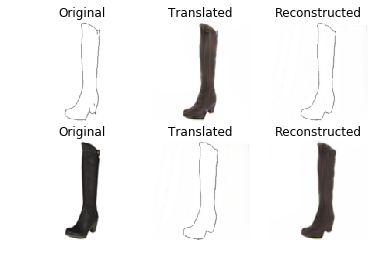

[2] [9500/24912] time: 11:00:55.367080, [d_loss: 0.127705, g_loss: 1.584609]


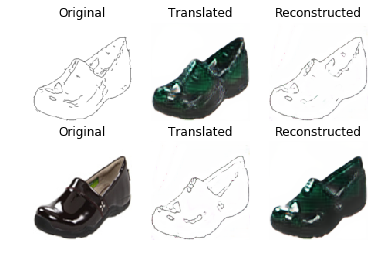

[2] [10000/24912] time: 11:05:28.535835, [d_loss: 0.151369, g_loss: 1.494354]


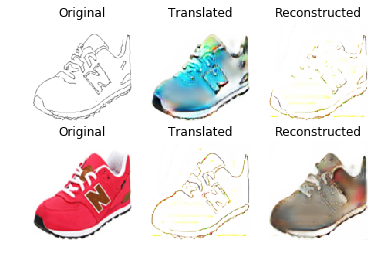

[2] [10500/24912] time: 11:10:01.533366, [d_loss: 0.113006, g_loss: 1.878472]


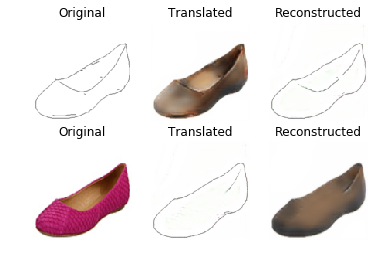

[2] [11000/24912] time: 11:14:34.384665, [d_loss: 0.135265, g_loss: 1.558511]


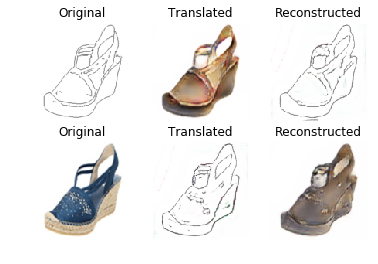

[2] [11500/24912] time: 11:19:07.102245, [d_loss: 0.132286, g_loss: 1.352620]


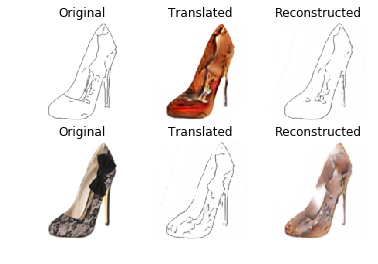

[2] [12000/24912] time: 11:23:40.007116, [d_loss: 0.135544, g_loss: 1.294869]


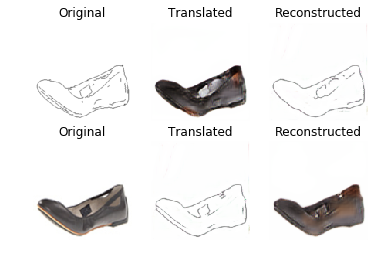

[2] [12500/24912] time: 11:28:12.741277, [d_loss: 0.128232, g_loss: 1.406338]


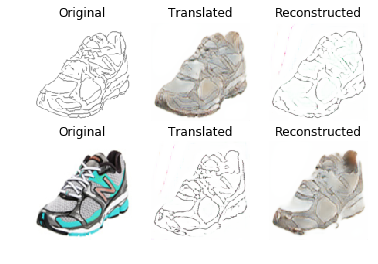

[2] [13000/24912] time: 11:32:45.375698, [d_loss: 0.128965, g_loss: 1.667733]


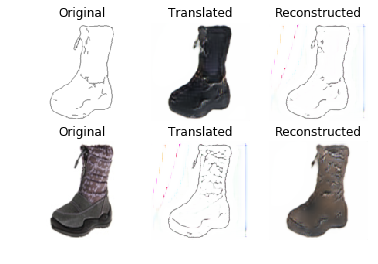

[2] [13500/24912] time: 11:37:18.013187, [d_loss: 0.129859, g_loss: 1.626369]


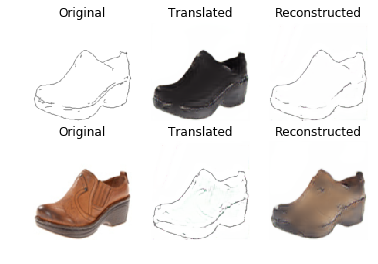

[2] [14000/24912] time: 11:41:50.627155, [d_loss: 0.161915, g_loss: 1.495495]


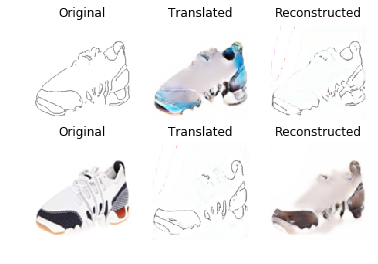

[2] [14500/24912] time: 11:46:23.352799, [d_loss: 0.122747, g_loss: 1.531226]


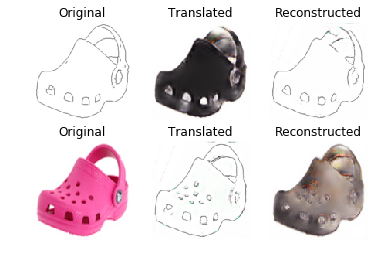

[2] [15000/24912] time: 11:50:56.019337, [d_loss: 0.168388, g_loss: 1.689765]


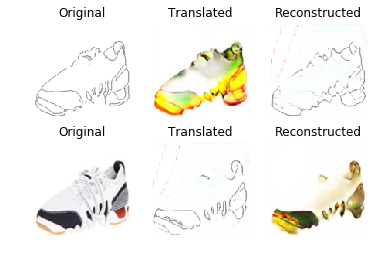

[2] [15500/24912] time: 11:55:28.630386, [d_loss: 0.123239, g_loss: 1.952253]


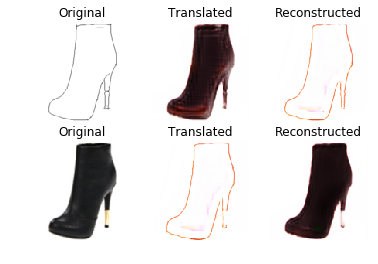

[2] [16000/24912] time: 12:00:01.294140, [d_loss: 0.157274, g_loss: 1.519700]


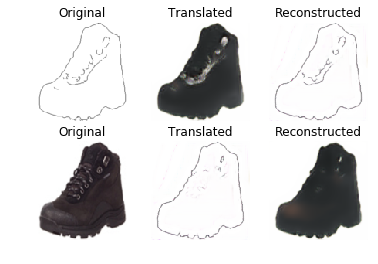

[2] [16500/24912] time: 12:04:33.807920, [d_loss: 0.147664, g_loss: 1.615387]


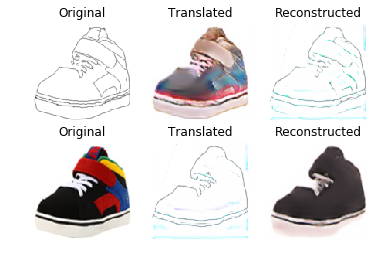

[2] [17000/24912] time: 12:09:06.251233, [d_loss: 0.129769, g_loss: 1.756816]


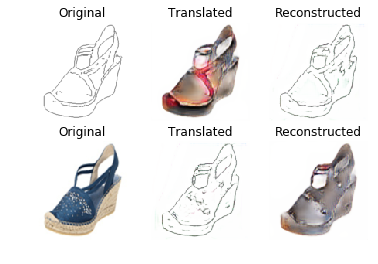

[2] [17500/24912] time: 12:13:38.885666, [d_loss: 0.149991, g_loss: 1.532714]


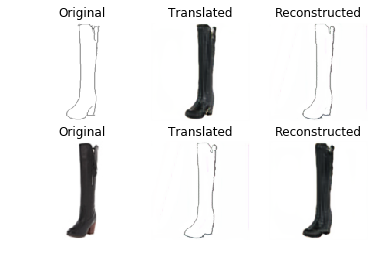

[2] [18000/24912] time: 12:18:11.772436, [d_loss: 0.136039, g_loss: 1.555403]


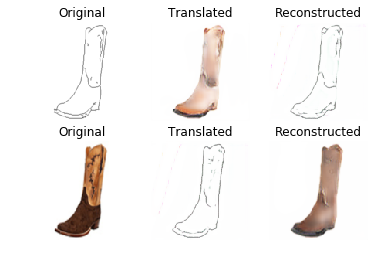

[2] [18500/24912] time: 12:22:44.336398, [d_loss: 0.129430, g_loss: 1.495701]


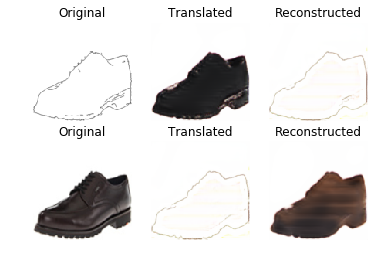

[2] [19000/24912] time: 12:27:16.728181, [d_loss: 0.116555, g_loss: 1.609211]


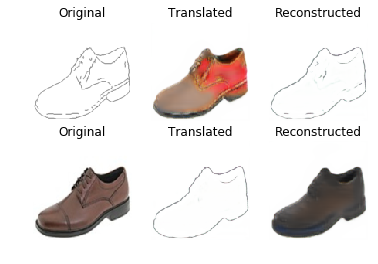

[2] [19500/24912] time: 12:31:48.853230, [d_loss: 0.133392, g_loss: 1.562976]


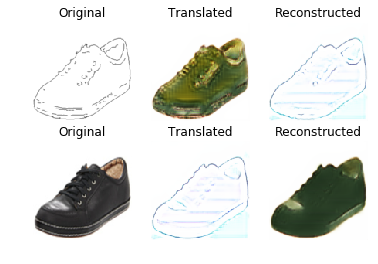

[2] [20000/24912] time: 12:36:21.338403, [d_loss: 0.125526, g_loss: 1.729652]


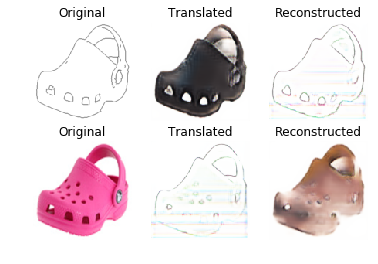

[2] [20500/24912] time: 12:40:53.895727, [d_loss: 0.125614, g_loss: 1.601226]


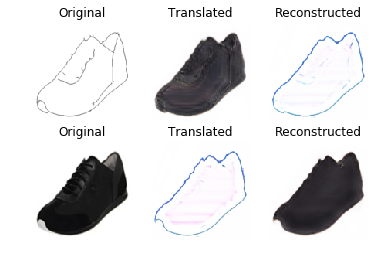

[2] [21000/24912] time: 12:45:26.580515, [d_loss: 0.132015, g_loss: 1.519359]


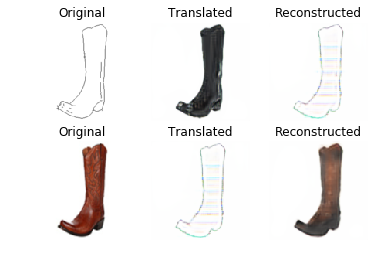

[2] [21500/24912] time: 12:49:59.112758, [d_loss: 0.122833, g_loss: 1.663279]


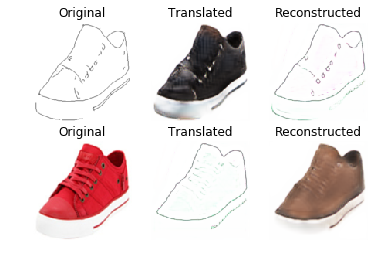

[2] [22000/24912] time: 12:54:31.623198, [d_loss: 0.244986, g_loss: 1.048340]


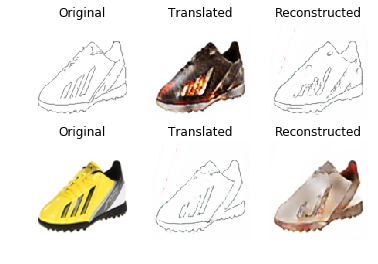

[2] [22500/24912] time: 12:59:04.529967, [d_loss: 0.150341, g_loss: 1.687226]


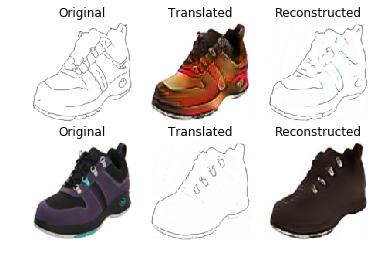

[2] [23000/24912] time: 13:03:37.324890, [d_loss: 0.157876, g_loss: 1.613814]


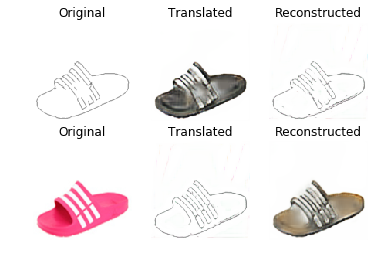

[2] [23500/24912] time: 13:08:10.274402, [d_loss: 0.144819, g_loss: 1.599725]


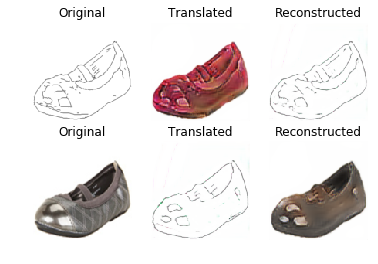

[2] [24000/24912] time: 13:12:43.529258, [d_loss: 0.124643, g_loss: 1.543948]


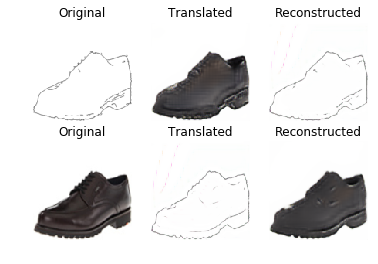

[2] [24500/24912] time: 13:17:16.512501, [d_loss: 0.163218, g_loss: 1.346872]


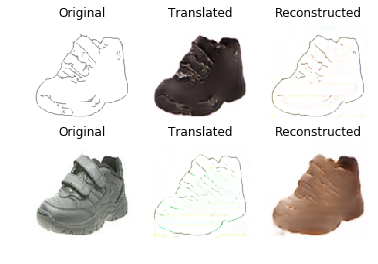

[3] [0/24912] time: 13:21:01.134355, [d_loss: 0.125667, g_loss: 1.534689]


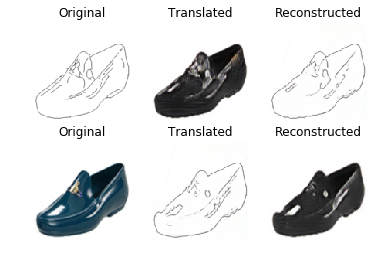

[3] [500/24912] time: 13:25:34.319876, [d_loss: 0.129289, g_loss: 1.459731]


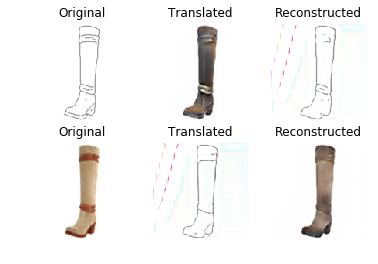

[3] [1000/24912] time: 13:30:07.364001, [d_loss: 0.121408, g_loss: 1.487059]


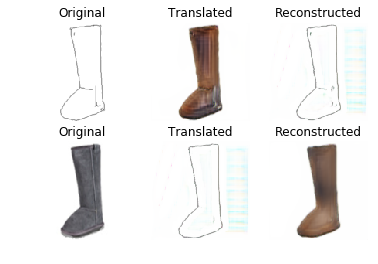

[3] [1500/24912] time: 13:34:40.328117, [d_loss: 0.133757, g_loss: 1.489746]


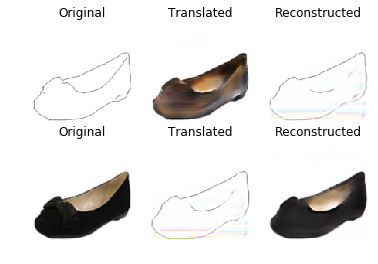

[3] [2000/24912] time: 13:39:13.169501, [d_loss: 0.127009, g_loss: 1.378348]


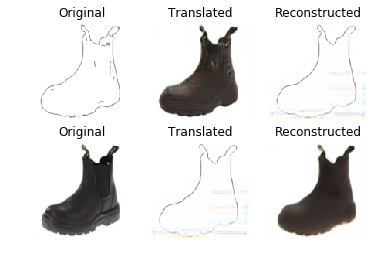

[3] [2500/24912] time: 13:43:46.117614, [d_loss: 0.130961, g_loss: 1.343230]


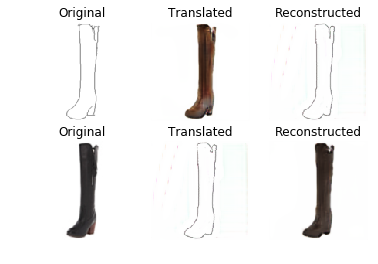

[3] [3000/24912] time: 13:48:19.033358, [d_loss: 0.100378, g_loss: 1.988372]


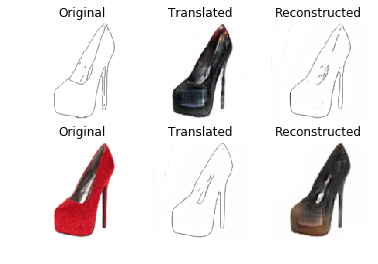

[3] [3500/24912] time: 13:52:51.970273, [d_loss: 0.131518, g_loss: 1.326105]


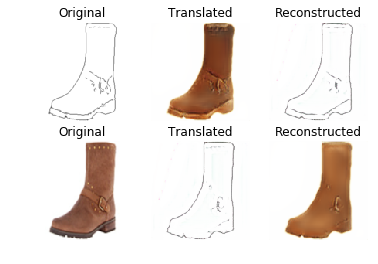

[3] [4000/24912] time: 13:57:25.091362, [d_loss: 0.160612, g_loss: 1.527358]


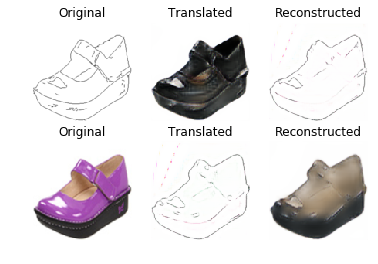

[3] [4500/24912] time: 14:01:58.172694, [d_loss: 0.121474, g_loss: 1.560924]


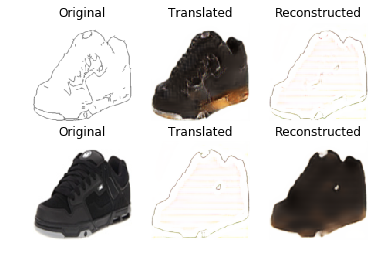

[3] [5000/24912] time: 14:06:31.387559, [d_loss: 0.135149, g_loss: 1.713369]


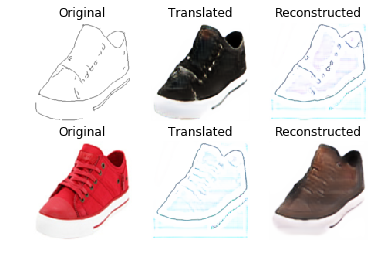

[3] [5500/24912] time: 14:11:04.601095, [d_loss: 0.122171, g_loss: 1.727482]


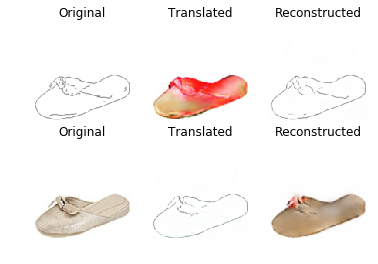

[3] [6000/24912] time: 14:15:37.774604, [d_loss: 0.168011, g_loss: 1.653222]


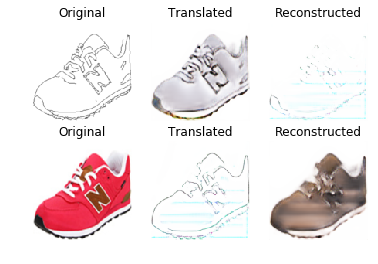

[3] [6500/24912] time: 14:20:10.680736, [d_loss: 0.110402, g_loss: 1.876700]


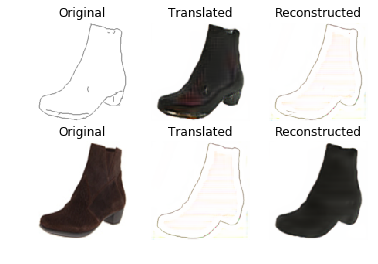

[3] [7000/24912] time: 14:24:43.564575, [d_loss: 0.135100, g_loss: 1.705932]


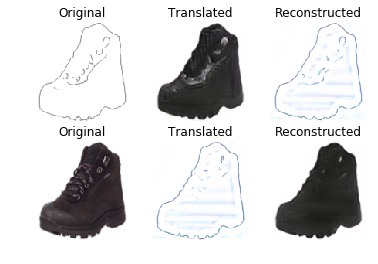

[3] [7500/24912] time: 14:29:16.382687, [d_loss: 0.117085, g_loss: 1.654616]


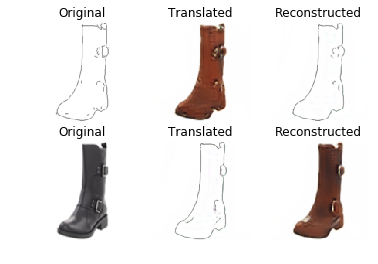

[3] [8000/24912] time: 14:33:49.095586, [d_loss: 0.257037, g_loss: 0.736668]


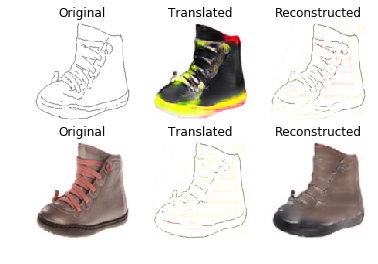

[3] [8500/24912] time: 14:38:22.070908, [d_loss: 0.110370, g_loss: 1.729866]


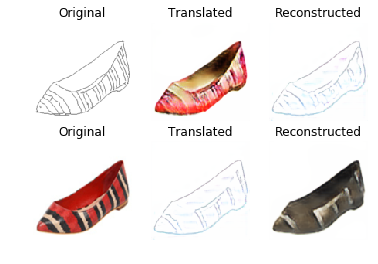

[3] [9000/24912] time: 14:42:54.934441, [d_loss: 0.128670, g_loss: 1.468664]


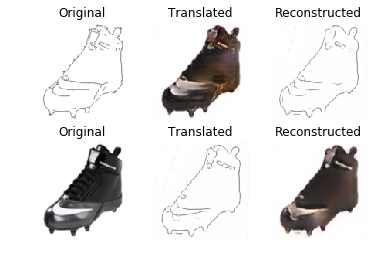

[3] [9500/24912] time: 14:47:27.512131, [d_loss: 0.122640, g_loss: 1.539538]


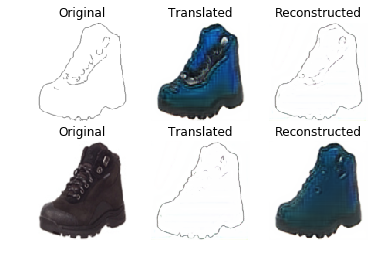

[3] [10000/24912] time: 14:52:00.001567, [d_loss: 0.126527, g_loss: 1.473148]


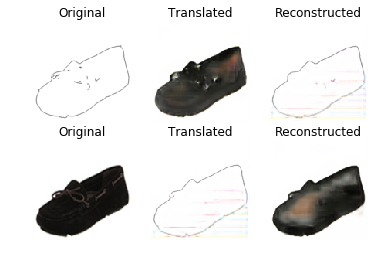

[3] [10500/24912] time: 14:56:35.902452, [d_loss: 0.127013, g_loss: 1.816383]


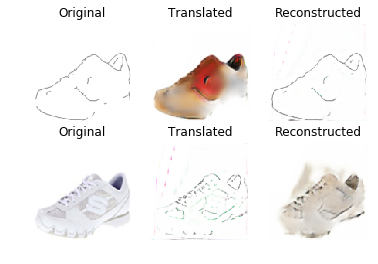

[3] [11000/24912] time: 15:28:07.173646, [d_loss: 0.133859, g_loss: 1.579985]


KeyboardInterrupt: 

In [4]:
gan = DiscoGAN()
gan.train(epochs=50, batch_size=2, sample_interval=500)